In [2]:
#!pip install --upgrade omicverse

In [ ]:
#%pip install mygen

In [510]:
import omicverse as ov
import scanpy as sc


In [4]:
import numpy as np
import pandas as pd

In [5]:
import matplotlib.pyplot as plt

In [507]:
import scipy


In [4]:
adata1=sc.read_10x_h5('D:scanpy/KBFC.h5')

adata1.obs['Sample']='KBFC'

adata2=sc.read_10x_h5('D:scanpy/KBFT.h5')
adata2.obs['Sample']='KBFT'

adata3=sc.read_10x_h5('D:scanpy/KBMC.h5')
adata3.obs['Sample']='KBMC'

adata4=sc.read_10x_h5('D:scanpy/KBMT.h5')
adata4.obs['Sample']='KBMT'

In [5]:
adata=sc.concat([adata1,adata2,adata3,adata4],merge='same')
adata

AnnData object with n_obs × n_vars = 58068 × 17896
    obs: 'Sample'
    var: 'gene_ids', 'feature_types', 'genome'

In [6]:
adata.obs['condition'] = adata.obs['Sample'].map({
    'KBFC': 'control', 'KBMC': 'control', 
    'KBMT': 'capsaicin', 'KBFT': 'capsaicin'
})

adata.obs['Sex'] = adata.obs['Sample'].map({
    'KBFC': 'Female', 'KBMC': 'Male', 
    'KBMT': 'Male', 'KBFT': 'Female'
})

adata.obs['Condition-Sex'] = adata.obs['Sample'].map({
    'KBFC': 'Female-Control', 'KBMC': 'Male-Control', 
    'KBMT': 'Male-Capsaicin', 'KBFT': 'Female-Capsaicin'
})

In [7]:
adata.X=adata.X.astype(np.int64)

In [11]:
adata.var_names = adata.var_names.astype(str)
flybase_ids = list(adata.var_names)

In [ ]:
import mygene

mg = mygene.MyGeneInfo()
res = mg.querymany(flybase_ids, scopes='flybase', fields='symbol', species=7227)

mapping_dict = {}
for item in res:
    if 'query' in item:
        key = str(item['query'])
        if item.get('notfound', False):
            mapping_dict[key] = key
        else:
            mapping_dict[key] = item.get('symbol', key)
    else:
        print("Warning: unexpected result format:", item)

In [ ]:
%%time
adata=ov.pp.qc(adata,
              tresh={'mito_perc': 0.1, 'nUMIs': 500, 'detected_genes': 250},
               doublets_method='sccomposite',
              batch_key=None)
adata

In [11]:
adata=ov.pp.preprocess(adata,mode='shiftlog|pearson',batch_key=None)
adata

Begin robust gene identification
After filtration, 15513/17896 genes are kept.     Among 15513 genes, 11335 genes are robust.
End of robust gene identification.
Begin size normalization: shiftlog and HVGs selection pearson
Time to analyze data in cpu: 82.19041109085083 seconds.
End of size normalization: shiftlog and HVGs selection pearson


AnnData object with n_obs × n_vars = 58068 × 11335
    obs: 'Sample', 'condition', 'Sex', 'Condition-Sex'
    var: 'gene_ids', 'feature_types', 'genome', 'gene_names', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_features'
    uns: 'log1p', 'hvg', 'status', 'status_args', 'REFERENCE_MANU'
    layers: 'counts'

In [21]:
adata.X=adata.X.astype(np.int64)
adata.X

<58068x11335 sparse matrix of type '<class 'numpy.int64'>'
	with 83492440 stored elements in Compressed Sparse Row format>

In [119]:
adata=ov.pp.preprocess(adata,mode='shiftlog|pearson',
                       n_HVGs=3000,batch_key=None)
adata

Begin robust gene identification
After filtration, 15513/17896 genes are kept.     Among 15513 genes, 11335 genes are robust.
End of robust gene identification.
Begin size normalization: shiftlog and HVGs selection pearson
Time to analyze data in cpu: 55.52638292312622 seconds.
End of size normalization: shiftlog and HVGs selection pearson


AnnData object with n_obs × n_vars = 58068 × 11335
    obs: 'Sample', 'condition', 'Sex', 'Condition-Sex'
    var: 'gene_ids', 'feature_types', 'genome', 'gene_names', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_features'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [120]:
%%time
adata.raw = adata
adata = adata[:, adata.var.highly_variable_features]
adata

CPU times: total: 734 ms
Wall time: 832 ms


View of AnnData object with n_obs × n_vars = 58068 × 3000
    obs: 'Sample', 'condition', 'Sex', 'Condition-Sex'
    var: 'gene_ids', 'feature_types', 'genome', 'gene_names', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_features'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [185]:
nCountsPerGene = np.sum(adata.X, axis=0)
nCellsPerGene = np.sum(adata.X>0, axis=0)

In [186]:
print("Number of counts (in the dataset units) per gene:", nCountsPerGene.min(), " - " ,nCountsPerGene.max())
print("Number of cells in which each gene is detected:", nCellsPerGene.min(), " - " ,nCellsPerGene.max())

Number of counts (in the dataset units) per gene: 47.264184089662834  -  135050.66765167232
Number of cells in which each gene is detected: 30  -  58059


In [187]:
nCells=adata.X.shape[0]

minCountsPerGene=3*.01*nCells # 3 counts in 1% of cells
print("minCountsPerGene: ", minCountsPerGene)

minSamples=.01*nCells # 1% of cells
print("minSamples: ", minSamples)

minCountsPerGene:  1742.04
minSamples:  580.6800000000001


In [ ]:
mito_genes = adata.var_names.str.startswith('mt:')
adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

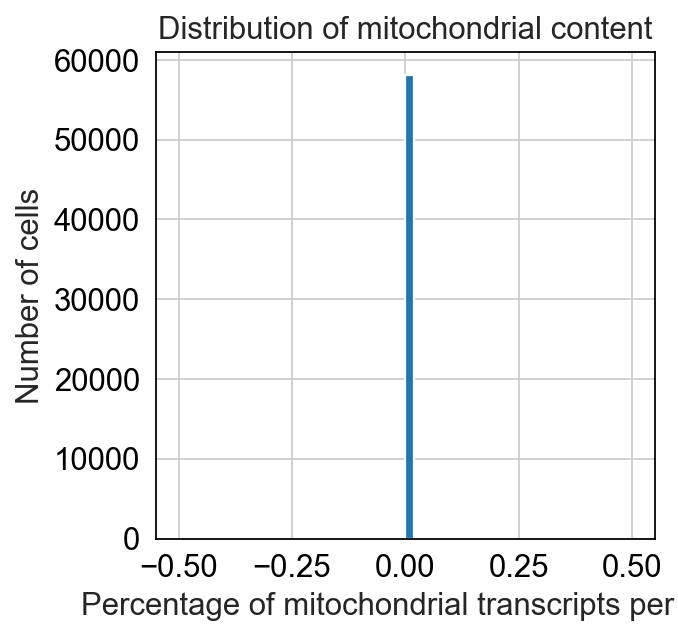

In [523]:

mito_gene_list = [
    # protein-coding
    "mt:ATP6", "mt:ATP8",
    "mt:COX1", "mt:COX2", "mt:COX3",
    "mt:CYTB",
    "mt:ND1", "mt:ND2", "mt:ND3", "mt:ND4", "mt:ND4L", "mt:ND5", "mt:ND6",
    # rRNAs
    "mt:lrRNA", "mt:srRNA",
]

# Flag mitochondrial genes
adata.var['mt'] = adata.var_names.isin(mito_gene_list)


mt_counts = adata[:, adata.var['mt']].X.sum(axis=1).A1 if scipy.sparse.issparse(adata.X) else adata[:, adata.var['mt']].X.sum(axis=1)
total_counts = adata.X.sum(axis=1).A1 if scipy.sparse.issparse(adata.X) else adata.X.sum(axis=1)

adata.obs['mito_perc'] = (mt_counts / total_counts) * 100


plt.hist(adata.obs['mito_perc'], bins=50)
plt.xlabel('Percentage of mitochondrial transcripts per cell')
plt.ylabel('Number of cells')
plt.title('Distribution of mitochondrial content')
plt.show()


In [220]:
missing_genes = [gene for gene in mito_gene_list if gene not in adata.var_names]

# Output results
if len(missing_genes) == 0:
    print("✅ All mitochondrial genes are present in adata.var_names.")
else:
    print(f"⚠️ Missing genes ({len(missing_genes)}):")
    print(missing_genes)

✅ All mitochondrial genes are present in adata.var_names.


In [212]:

mito_genes_present = [gene for gene in mito_gene_list if gene in adata.var_names]


adata.obs['percent_mito'] = (
    np.sum(adata[:, mito_genes_present].X, axis=1).A1
    / np.sum(adata.X, axis=1).A1
) * 1
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

In [210]:
adata

AnnData object with n_obs × n_vars = 58068 × 3000
    obs: 'Sample', 'condition', 'Sex', 'Condition-Sex', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'leiden', 'leiden_res_0.10', 'leiden_res_0.20', 'leiden_res_0.30', 'leiden_res_0.40', 'leiden_res_0.50', 'leiden_res_0.60', 'leiden_res_0.70', 'leiden_res_0.80', 'leiden_res_0.90', 'leiden_res_1.00', 'leiden_res_1.10', 'leiden_res_1.20', 'leiden_res_1.30', 'leiden_res_1.40', 'leiden_res_1.50', 'leiden_res_1.60', 'leiden_res_1.70', 'leiden_res_1.80', 'leiden_res_1.90', 'leiden_res_2.00', 'leiden_res_2.20', 'leiden_res_2.40', 'leiden_res_2.60', 'leiden_res_2.80', 'leiden_res_3.00', 'leiden_res_3.20', 'leiden_res_3.40', 'leiden_res_3.60', 'leiden_res_3.80', 'leiden_res_4.00', 'leiden_res_4.20', 'leiden_res_4.40', 'leiden_res_4.60', 'leiden_res_4.80', 'leiden_res_5.00', 'temp_density', 'Cell_type', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells', 'percent_cells', 'robust', 'means', 'va

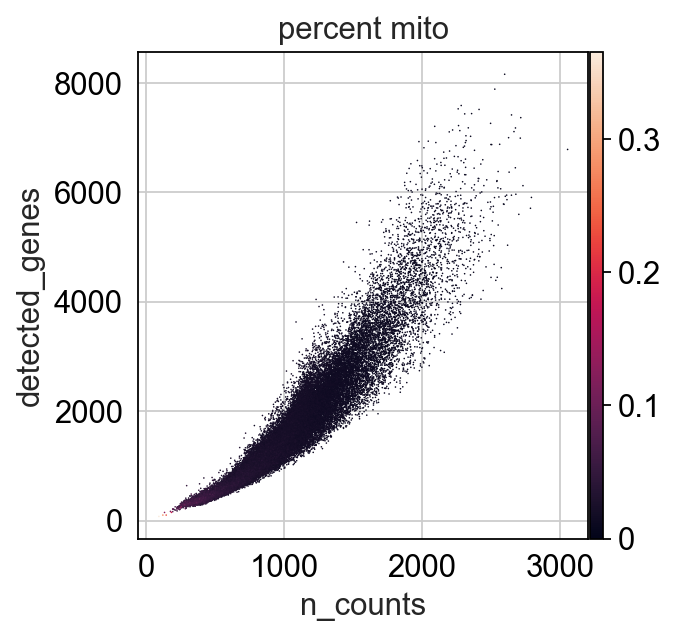

In [512]:
sc.pl.scatter(adata, x='n_counts', y='detected_genes', color='percent_mito')

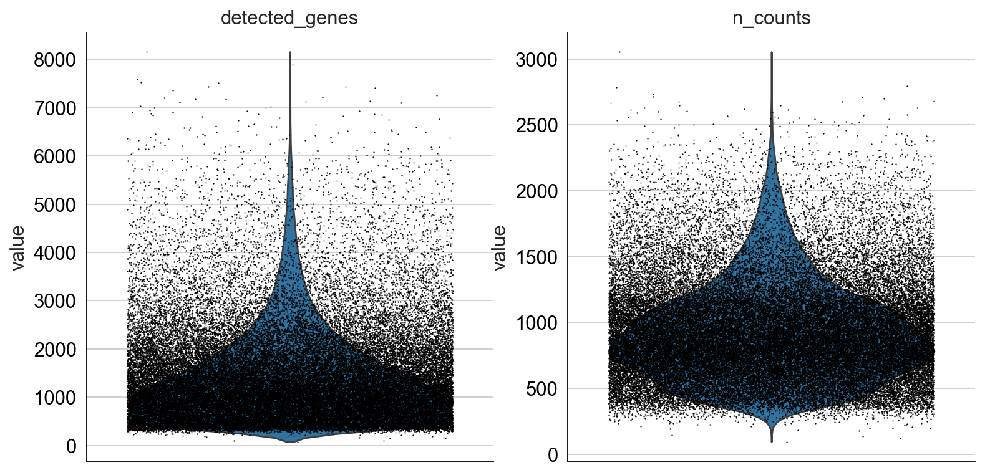

In [524]:
sc.pl.violin(adata, ['detected_genes', 'n_counts'],
    jitter=0.4, multi_panel=True )

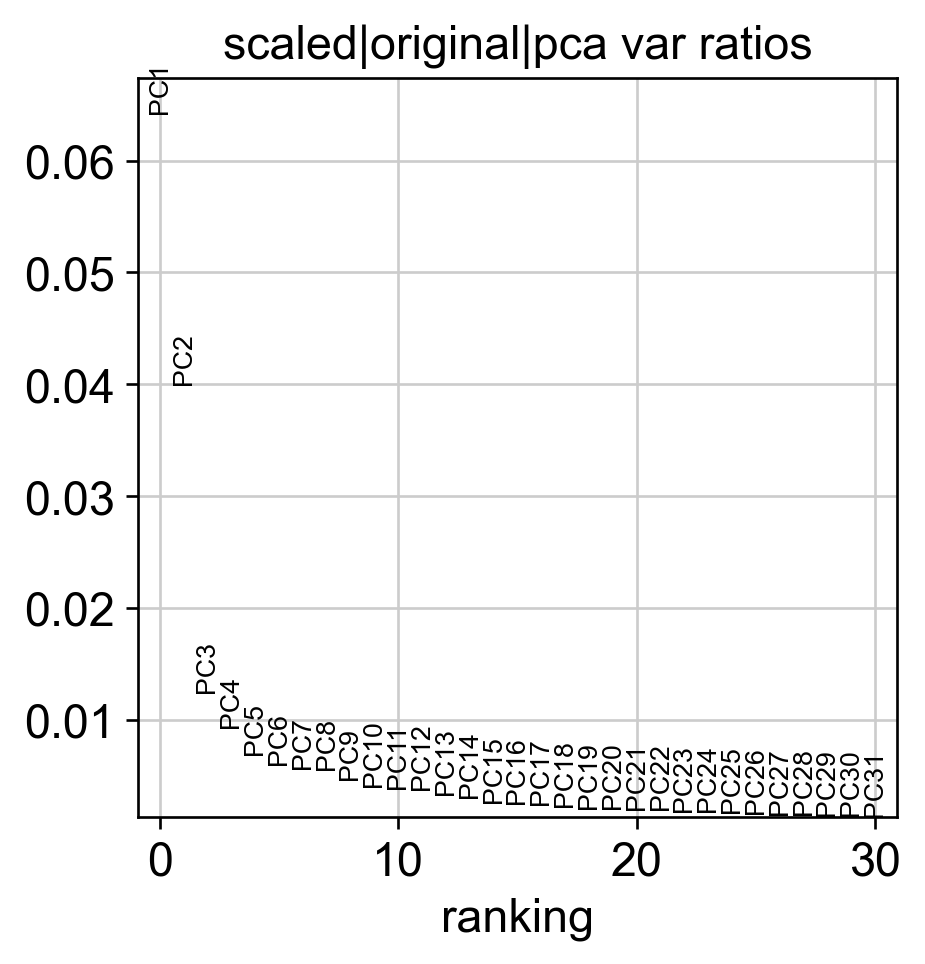

In [221]:
ov.utils.plot_pca_variance_ratio(adata)

In [7]:
adata_raw = adata.raw.to_adata()

In [ ]:
adata_raw.var_names = adata_raw.var_names.astype(str)
flybase_ids = list(adata_raw.var_names)
import mygene

mg = mygene.MyGeneInfo()
res = mg.querymany(flybase_ids, scopes='flybase', fields='symbol', species=7227)
mapping_dict = {}
for item in res:
    if 'query' in item:
        key = str(item['query'])
        if item.get('notfound', False):
            mapping_dict[key] = key
        else:
            mapping_dict[key] = item.get('symbol', key)
    else:
        print("Warning: unexpected result format:", item)
adata_raw.var['gene_names'] = adata_raw.var_names.map(mapping_dict)

In [9]:
adata_raw.var['gene_names']

FBgn0031081       Nep3
FBgn0031088    CG15322
FBgn0031080    CG12655
FBgn0053217    CG33217
FBgn0052350      Vps11
                ...   
FBgn0031287     CG4291
FBgn0020304     drongo
FBgn0031286     CG3862
FBgn0031284      PGAP2
FBgn0031281       Saf6
Name: gene_names, Length: 11335, dtype: object

In [122]:
ov.pp.scale(adata)
ov.pp.pca(adata,layer='scaled',n_pcs=50)

adata.obsm["X_mde_pca"] = ov.utils.mde(adata.obsm["scaled|original|X_pca"])

<AxesSubplot: title={'center': 'Sample'}, xlabel='X_mde_pca1', ylabel='X_mde_pca2'>

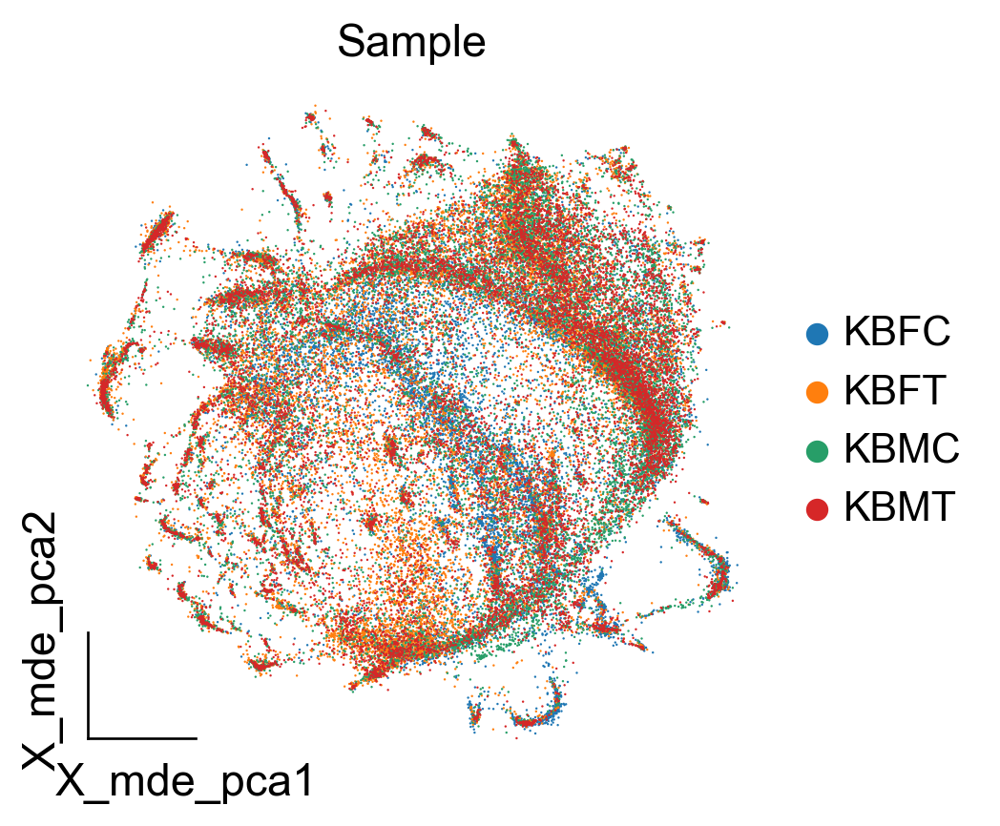

In [123]:
ov.utils.embedding(adata,
                basis='X_mde_pca',frameon='small',
                color=['Sample'],show=False)

In [124]:
ov.single.batch_correction(adata,batch_key='Sample',
                                        methods='harmony',n_pcs=50)
adata

...Begin using harmony to correct batch effect


2025-05-03 14:52:42,683 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-05-03 14:53:03,778 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-05-03 14:53:04,848 - harmonypy - INFO - Iteration 1 of 10
2025-05-03 14:54:18,681 - harmonypy - INFO - Iteration 2 of 10
2025-05-03 14:55:32,573 - harmonypy - INFO - Iteration 3 of 10
2025-05-03 14:56:46,107 - harmonypy - INFO - Iteration 4 of 10
2025-05-03 14:58:00,068 - harmonypy - INFO - Iteration 5 of 10
2025-05-03 14:58:40,002 - harmonypy - INFO - Converged after 5 iterations


AnnData object with n_obs × n_vars = 58068 × 3000
    obs: 'Sample', 'condition', 'Sex', 'Condition-Sex'
    var: 'gene_ids', 'feature_types', 'genome', 'gene_names', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_features'
    uns: 'log1p', 'hvg', 'pca', 'scaled|original|pca_var_ratios', 'scaled|original|cum_sum_eigenvalues', 'Sample_colors'
    obsm: 'X_pca', 'scaled|original|X_pca', 'X_mde_pca', 'X_harmony'
    varm: 'PCs', 'scaled|original|pca_loadings'
    layers: 'counts', 'scaled'

In [125]:
adata.obsm["X_mde_harmony"] = ov.utils.mde(adata.obsm["X_harmony"])


<AxesSubplot: title={'center': 'Sample'}, xlabel='X_mde_harmony1', ylabel='X_mde_harmony2'>

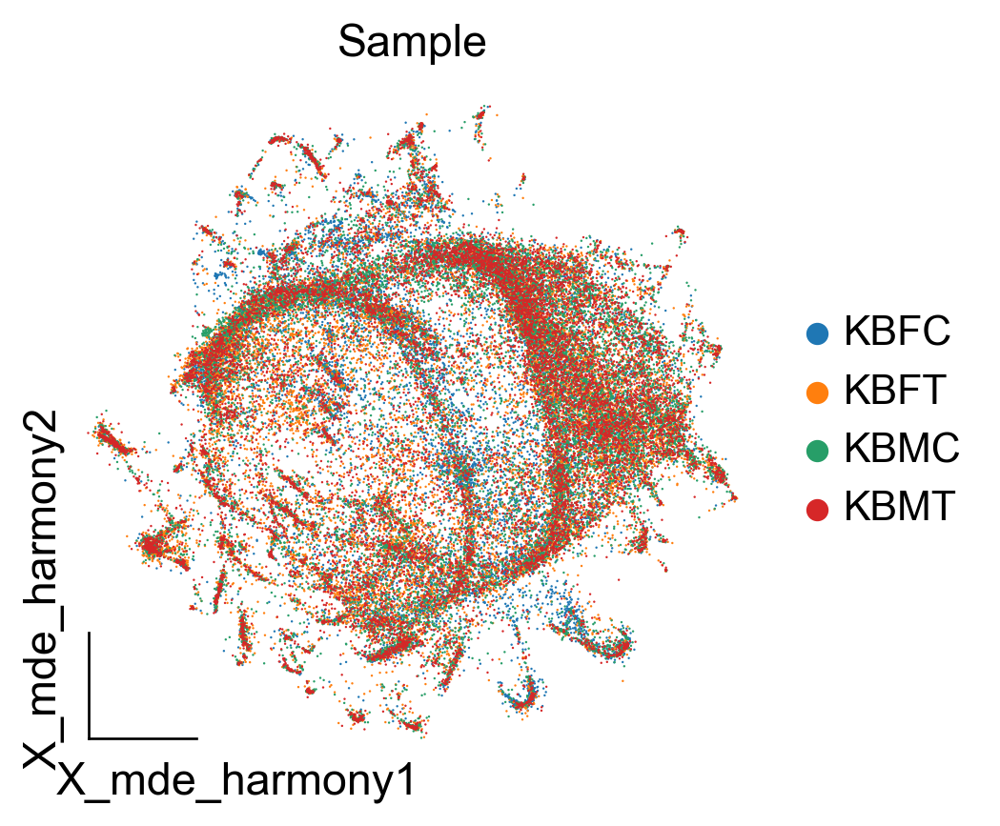

In [126]:
ov.utils.embedding(adata,
                basis='X_mde_harmony',frameon='small',
                color=['Sample'],show=False)

In [127]:

%%time
ov.pp.neighbors(adata, n_neighbors=15, n_pcs=50,
               use_rep='scaled|original|X_pca')
ov.pp.umap(adata)


CPU times: total: 2min 30s
Wall time: 2min 29s


Resolution 0.1: 11 clusters
Resolution 0.2: 20 clusters
Resolution 0.3: 27 clusters
Resolution 0.4: 29 clusters
Resolution 0.5: 32 clusters
Resolution 0.6: 33 clusters
Resolution 0.7: 36 clusters
Resolution 0.8: 38 clusters
Resolution 0.9: 39 clusters
Resolution 1.0: 44 clusters
Resolution 1.2: 46 clusters


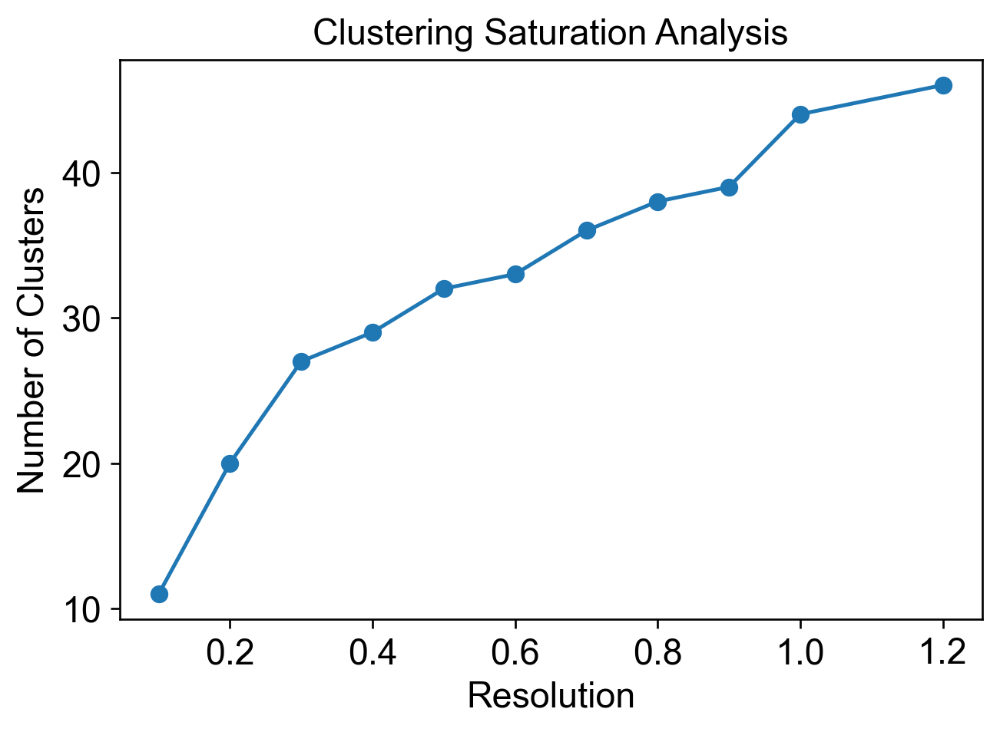

In [99]:
resolutions = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.2]
             # 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.4, 2.6, 2.8, 3.0,
              #3.2, 3.4, 3.6, 3.8, 4.0, 4.2, 4.4, 4.6, 4.8, 5.0]
cluster_counts = []

for res in resolutions:
    n_clusters = adata.obs[f"leiden_res_{res:4.2f}"].nunique()
    cluster_counts.append(n_clusters)
    print(f"Resolution {res}: {n_clusters} clusters")

# Plot the number of clusters vs. resolution
plt.figure(figsize=(6,4))
plt.plot(resolutions, cluster_counts, marker='o')
plt.xlabel("Resolution")
plt.ylabel("Number of Clusters")
plt.grid()
plt.title("Clustering Saturation Analysis")
plt.show()

In [ ]:
ov.pp.leiden(adata,resolution=1.0)

In [101]:
ov.pp.leiden(adata_raw,resolution=1.0)

In [23]:
ov.pp.umap(adata, min_dist=0.3, )
ov.pp.umap(adata_raw, min_dist=0.3, )

In [ ]:
ov.pp.neighbors(adata)
ov.pp.neighbors(adata_raw)

In [181]:
sc.tl.dendrogram(adata_raw,'leiden',use_rep='scaled|original|X_pca')
sc.tl.rank_genes_groups(adata_raw, groupby='leiden', 
                        method='t-test',use_rep='scaled|original|X_pca', use_raw=False )
ov.single.cosg(adata_raw, key_added='leiden', groupby='leiden', remove_lowly_expressed=True)

**finished identifying marker genes by COSG**


In [188]:
sc.pl.rank_genes_groups_dotplot(adata_raw,groupby='leiden', 
                                cmap='Spectral_r',key='leiden', gene_symbols='gene_names',
                                standard_scale='var',n_genes=10)

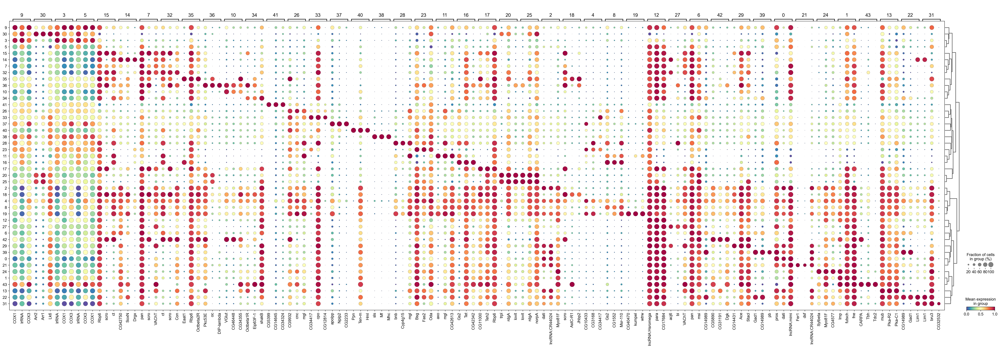

In [123]:
sc.tl.dendrogram(adata_raw,'leiden',use_rep='scaled|original|X_pca')
sc.tl.rank_genes_groups(adata_raw, 'leiden', use_rep='scaled|original|X_pca',
                        method='wilcoxon',use_raw=False,key_added='leiden_wilcoxon')
sc.pl.rank_genes_groups_dotplot(adata_raw,groupby='leiden',
                                cmap='Spectral_r',key='leiden_wilcoxon', gene_symbols='gene_names',
                                standard_scale='var',n_genes=3)


In [301]:
Cell_type_Dict = {
    "0": "CB-A",
    "1": "CB-B",
    "2": "CHO",
    "3": "PRC1",
    "4": "UN-G1",
    "5": "UN-N1",
    "6": "GABA1",
    "7": "CHO2",
    "8": "EN-G1",
    "9": "PRC2",
    "10": "GLU1",
    "11": "EN-G2",
    "12": "CB-A2",
    "13": "KC",
    "14": "Tm1-Y8",
    "15": "T4-T5",
    "16": "A-G1",
    "17": "L1-5",
    "18": "OL-CHO",
    "19": "CTX-G",
    "20": "PRC3",
    "21": "CB-A2",
    "22": "PoxnN",
    "23": "Pn-G",
    "24": "PD-N",
    "25": "PRC4",
    "26": "SPn-G",
    "27": "CHO3",
    "28": "UN-G2",
    "29": "OPN",
    "30": "PRC5",
    "31": "DOP",
    "32": "T2-T3",
    "33": "UN-G3",
    "34": "C2-C3",
    "35": "T1",
    "36": "OLNP-G",
    "37": "MBON",
    "38": "MUS",
    "39": "GABA2",
    "40": "HEMO",
    "41": "UN",
    "42": "GLU2",
    "43": "OCT"
}

adata.obs["Cell_type"] = adata.obs["leiden"].map(Cell_type_Dict)

In [302]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors

Cell_type_names = [
    "CB-A",
    "CB-B",
    "CHO",
    "PRC1",
    "UN-G1",
    "UN-N1",
    "GABA1",
    "CHO2",
    "EN-G1",
    "PRC2",
    "GLU1",
    "EN-G2",
    "CB-A2",
    "KC",
    "Tm1-Y8",
    "T4-T5",
    "A-G1",
    "L1-5",
    "OL-CHO",
    "CTX-G",
    "PRC3",
    "CB-A2",
    "PoxnN",
    "Pn-G",
    "PD-N",
    "PRC4",
    "SPn-G",
    "CHO3",
    "UN-G2",
    "OPN",
    "PRC5",
    "DOP",
    "T2-T3",
    "UN-G3",
    "C2-C3",
    "T1",
    "OLNP-G",
    "MBON",
    "MUS",
    "GABA2",
    "HEMO",
    "UN",
    "GLU2",
    "OCT"
]
n = len(Cell_type_names)
cividis_r = cm.get_cmap('tab20', n) 
hex_colors = [mcolors.rgb2hex(cividis_r(i)) for i in range(n)]

Cell_type_Colors = {name: hex_color for name, hex_color in zip(Cell_type_names, hex_colors)}



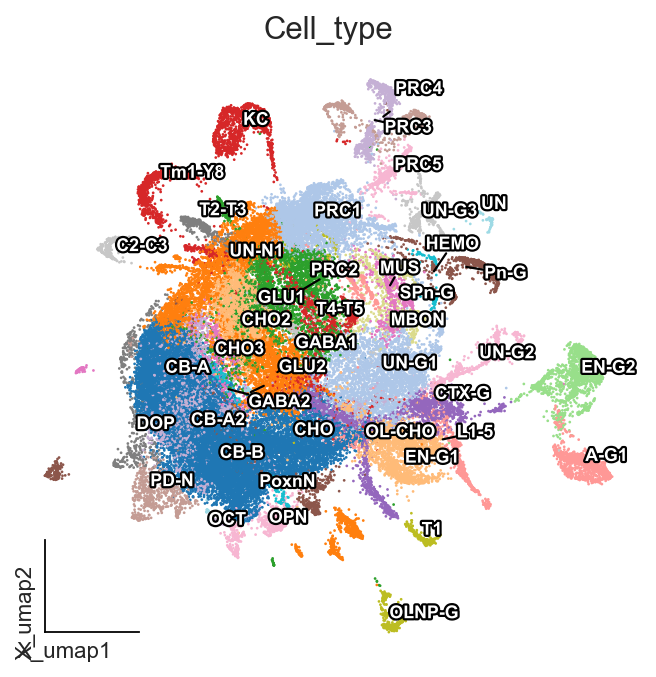

In [303]:
import matplotlib.patheffects as patheffects
fig, ax = plt.subplots(figsize=(5,5))
ov.pl.embedding(adata,
                  basis='X_umap',
                  color=['Cell_type'],
                   show=False, add_outline=False, palette=Cell_type_Colors,
                   frameon='small',legend_fontoutline=2,ax=ax, cmap='Accent' ,size=6, legend_fontsize=10, legend_loc=None
                 )

ov.utils.gen_mpl_labels(
    adata, 'Cell_type',
    exclude=("None",),  
    basis='X_umap',
    ax=ax,
    adjust_kwargs=dict(
        arrowprops=dict(
            arrowstyle='-',          
            color='black',
            shrinkA=10,                  
            shrinkB=10,                
        )
    ),
    text_kwargs=dict(
        fontsize=8,        
        weight='bold',
        color='white',
        path_effects=[patheffects.withStroke(linewidth=2, foreground='black')]
    ),
)

plt.show()

In [140]:
adata_raw.obs['Condition-Sex'].value_counts()

Condition-Sex
Female-Capsaicin    16285
Male-Control        14661
Male-Capsaicin      13995
Female-Control      13127
Name: count, dtype: int64

In [503]:
adata.obs["Cell_type"].value_counts()


Cell_type
CB-A      6369
CB-B      6057
CHO       4657
PRC1      3461
UN-G1     3184
UN-N1     3174
GABA1     2918
CHO2      2337
CB-A2     2038
EN-G1     2004
PRC2      1829
GLU1      1530
EN-G2     1468
KC        1283
Tm1-Y8    1260
T4-T5     1180
A-G1      1067
L1-5       958
OL-CHO     895
CTX-G      894
PRC3       873
PoxnN      619
Pn-G       618
PD-N       604
PRC4       571
SPn-G      558
CHO3       536
UN-G2      532
OPN        527
PRC5       466
DOP        465
T2-T3      460
UN-G3      435
C2-C3      434
OLNP-G     366
T1         366
MBON       291
MUS        283
GABA2      251
HEMO       104
UN         103
GLU2        35
OCT          8
Name: count, dtype: int64

PyComplexHeatmap have been install version: 1.8.2
Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..
Inferred max_s (max size of scatter point) is: 49.27582149792649
Plotting legends..
Estimated legend width: 50.695555555555565 mm


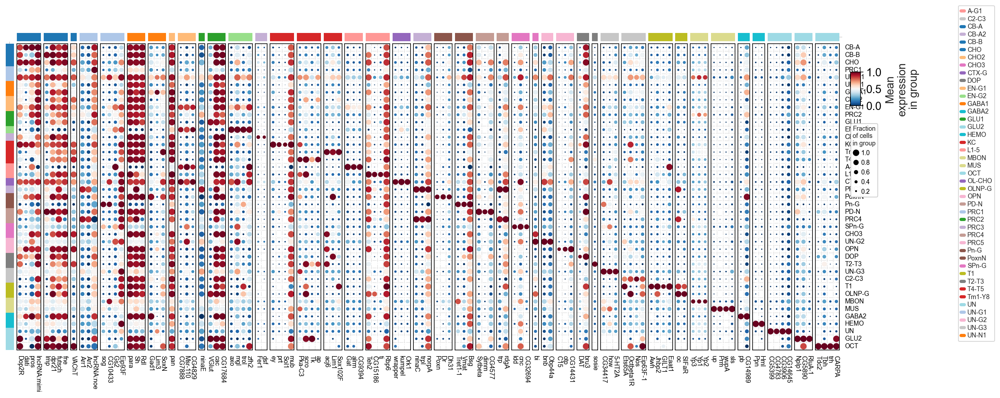

In [505]:
marker_genes_dict = {
    'CB-A': ['Dop2R', 'dati', 'pros', 'lncRNA:mimi'],
    'CB-B': ['Imp', 'dpr21', 'futsch', 'fne'],
    'CHO': ['VAChT'],
    'PRC1': ['Arr1', 'Arr2', 'lncRNA:noe'],
    'UN-G1': ['sog', 'CG10433', 'Gs2', 'Eip93F'],
    'UN-N1': ['para', 'Sh', 'Rdl'],
    'GABA1': ['Gad1', 'Lim3', 'SoxN'],
    'CHO2': ['pan'],
    'EN-G1': ['CG7888', 'Msr-110', 'CG4829'],
    'PRC2': ['ninaE'],
    'GLU1': ['VGlut', 'cac', 'CG17684'],
    'EN-G2': ['axo', 'mgl', 'trol', 'zfh2'],
    'CB-A2': ['mbl', 'nAChRalpha7'],
    'KC': ['ey', 'prt', 'Sol1', 'mub'],
    'Tm1-Y8': ['Pka-C3', 'scro', 'Tk', 'ap'],
    'T4-T5': ['acj6', 'Lim1', 'Sox102F'],
    'A-G1': ['Gat', 'alrm', 'CG9394'],
    'L1-5': ['Teh2', 'CG15186', 'tj', 'Rbp6'],
    'CTX-G': ['wrapper', 'kumpel', 'Ork1'],
    'PRC3': ['ninaC', 'trpl', 'norpA'],
    'CB-A2': ['Fer1', 'dsf'],
    'PoxnN': ['Poxn', 'Dr', 'Dh31'],
    'Pn-G': ['Tret1-1', 'Vmat', 'Bsg'],
    'PD-N': ['Sytbeta', 'dimm', 'CG4577'],
    'PRC4': ['trp', 'rdgA'],
    'SPn-G': ['ldd', 'cnc', 'CG32694'],
    'CHO3': ['bi'],
    'UN-G2': ['bnb', 'Obp44a'],
    'OPN': ['C15', 'otp', 'CG14431'],
    'DOP': ['DAT', 'bru3'],
    'T2-T3': ['sosie'],
    'UN-G3': ['CG34417', 'how', '5-HT2A'],
    'C2-C3': ['Ets65A', 'Octbeta1R', 'Nos', 'Eip63F-1'],
    'T1': ['Awh', 'Jhbp2', 'GILT1', 'Eaat1'],
    'OLNP-G': ['oc', 'SIFaR'],
    'MBON': ['Yp3', 'Yp1', 'Yp2'],
    'MUS': ['up', 'Prm', 'wupA', 'sls'],
    'GABA2': ['pb', 'CG14989'],
    'HEMO': ['Ppn', 'Hml'],
    'UN': ['CG5399', 'CG4783', 'CG3906', 'CG14645'],
    'GLU2': ['Nplp1', 'CG5890', 'RluA-1'],
    'OCT': ['Tdc2', 'Tbh', 'trh', 'CARPA']
}


ax = ov.pl.marker_heatmap(adata,
    marker_genes_dict,
    groupby='Cell_type',
    color_map="RdBu_r",
    use_raw=False,  
    standard_scale="var",
    expression_cutoff=0.0,
    fontsize=8, 
    bbox_to_anchor=(10, -2), 
    figsize=(15,6),
    spines=True,  
    show_rownames=True,
    show_colnames=True, #save_path="C:/Users/Student/Desktop/markers.png"
)



In [584]:
adata.write('D:/scanpy/omicsverse_may07.h5ad', compression="gzip")

